<a href="https://colab.research.google.com/github/Rogerio-mack/BIG_DATA_Analytics_Mineracao_e_Analise_de_Dados/blob/main/read_nirs_filesv2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Sumário

Captura e explora dados brutos de fNIRS no formato `.nirs`. 

Saídas:     

* Cria uma tabela de sumário dos canais
* Cria uma tabela de dos dados raw
* Cria uma tabela dos estímulos

<br>
<br>

<small>




# Mount Google Drive

Para acesso aos arquivos compartilhados. Tenha certeza de ter adicionado a pasta compartilhada ao seu Google Drive antes.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
# drive.mount('/content/drive', force_remount=True)


Mounted at /content/drive


In [ ]:
# drive.flush_and_unmount()

# Common Imports

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from itertools import compress



# `.nirs`sub routines

In [ ]:
#@markdown **def suboutines**
#@markdown ---
#@markdown * plotchannels(df, ncols_display=5, title='Display Channels') 
#@markdown > *plot raw data from each channel*
#@markdown * def remove_outlier(df_in, col_name)
#@markdown > *remove outliers from a single channel*

def plotchannels(df, ncols_display=3, title='Display Raw Channels'):
  nr_channels = len(df.columns)
  ncols= ncols_display
  nrows= int(nr_channels/ncols + 1)

  fig, ax = plt.subplots(nrows=nrows, ncols=ncols, sharex=False, sharey=False, figsize=(ncols*5,nrows*3.5))

  i = 0
  for c in df.drop(columns=['time']):
    ax[i//ncols,i%ncols].plot(df.time, df[c], color=['blue','red'][df[c].min() < 0] )
    ax[i//ncols,i%ncols].set_title(c) # , weight='bold')
    # plt.xticks([])
    ax[i//ncols,i%ncols].grid()
    ax[i//ncols,i%ncols].set_xlabel('Time')
    i = i + 1
  
  plt.suptitle(title, fontsize=14, weight='bold', y=1.05)

  plt.tight_layout()
  plt.show()

  return

def remove_outlier(df_in, col_name):
    q1 = df_in[col_name].quantile(0.25)
    q3 = df_in[col_name].quantile(0.75)
    iqr = q3-q1 #Interquartile range
    fence_low  = q1-1.5*iqr
    fence_high = q3+1.5*iqr
    df_out = df_in.loc[(df_in[col_name] > fence_low) & (df_in[col_name] < fence_high)]
    return df_out  

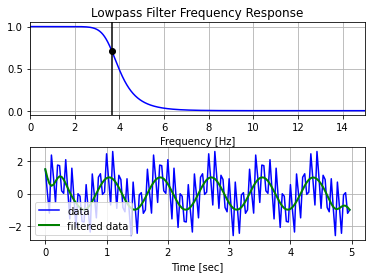


cutoff....  3.667
fs........  30.0
order.....  6



In [ ]:
#@markdown **def suboutines**
#@markdown ---
#@markdown * def butter_lowpass_filter(data, cutoff, fs, order=5) 
#@markdown > *lowpass filter data from a single channel*


# https://stackoverflow.com/questions/25191620/
#   creating-lowpass-filter-in-scipy-understanding-methods-and-units

import numpy as np
from scipy.signal import butter, lfilter, freqz, filtfilt
from matplotlib import pyplot as plt


def butter_lowpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a


def butter_lowpass_filter(data, cutoff, fs, order=5):
    b, a = butter_lowpass(cutoff, fs, order=order)
#    y = lfilter(b, a, data)
    y = filtfilt(b, a, data)
    return y


# Filter requirements.
order = 6
fs = 30.0       # sample rate, Hz
cutoff = 3.667  # desired cutoff frequency of the filter, Hz

# Get the filter coefficients so we can check its frequency response.
b, a = butter_lowpass(cutoff, fs, order)

# Plot the frequency response.
w, h = freqz(b, a, worN=8000)
plt.subplot(2, 1, 1)
plt.plot(0.5*fs*w/np.pi, np.abs(h), 'b')
plt.plot(cutoff, 0.5*np.sqrt(2), 'ko')
plt.axvline(cutoff, color='k')
plt.xlim(0, 0.5*fs)
plt.title("Lowpass Filter Frequency Response")
plt.xlabel('Frequency [Hz]')
plt.grid()


# Demonstrate the use of the filter.
# First make some data to be filtered.
T = 5.0             # seconds
n = int(T * fs)     # total number of samples
t = np.linspace(0, T, n, endpoint=False)
# "Noisy" data.  We want to recover the 1.2 Hz signal from this.
data = np.sin(1.2*2*np.pi*t) + 1.5*np.cos(9*2*np.pi*t) \
        + 0.5*np.sin(12.0*2*np.pi*t)

# Filter the data, and plot both the original and filtered signals.
y = butter_lowpass_filter(data, cutoff, fs, order)

plt.subplot(2, 1, 2)
plt.plot(t, data, 'b-', label='data')
plt.plot(t, y, 'g-', linewidth=2, label='filtered data')
plt.xlabel('Time [sec]')
plt.grid()
plt.legend()

plt.subplots_adjust(hspace=0.35)
plt.show()

print()
print('cutoff.... ', cutoff)
print('fs........ ', fs)
print('order..... ', order)
print()

In [ ]:
# @markdown **def suboutines**
# @markdown ---
# @markdown * def df_filter(df, cutoff=0.8, fs=30, order=5, title='Filtered Data') 
# @markdown > *plot raw, cutted and filter data from each channel*

def df_filter(df, cutoff=0.8, fs=30, order=5, title='Filtered Data'): 

  nr_channels = len(df.columns)
  ncols= 3
  nrows= nr_channels

  fig, ax = plt.subplots(nrows=nrows, ncols=ncols, sharex=False, sharey=False, figsize=(ncols*5,nrows*3.5))

  i = 0
  for c in df.drop(columns=['time']):
    y_cutted = remove_outlier(df,c)[c]
    y_filtered = butter_lowpass_filter(df[c], cutoff=cutoff, fs=fs, order=order)

    ax[i,0].plot(df.time, df[c], 'b-', label='raw data', alpha=0.8)
    ax[i,0].plot(df.time, y_filtered, 'r-', label='filtered data')
    ax[i,0].set_title('Channel ' + str(c) + ', Raw Data')
    ax[i,0].set_xlabel('Time')
    ax[i,0].grid()
    ax[i,0].legend()

    # ax[i,1].plot(df[c], 'b-', label='raw data')
    ax[i,1].plot(y_cutted, 'k-', label='cutted data', alpha=0.8)
    ax[i,1].set_title('Channel ' + str(c) + ', Cutted Data')
    ax[i,1].set_xlabel('Time')
    ax[i,1].grid()
    ax[i,1].legend()

    # ax[i,2].plot(df[c], 'b-', label='raw data')
    ax[i,2].plot(df.time, y_filtered, 'r-', label='filtered data', alpha=0.8)
    ax[i,2].set_title('Channel ' + str(c) + ', Filtered Data')
    ax[i,2].set_xlabel('Time')
    ax[i,2].grid()
    ax[i,2].legend()

    i=i+1

  plt.suptitle(title, fontsize=14, weight='bold', y=1.05)

  plt.tight_layout()
  plt.show()

  return  

# df_filter(raw[['time','S1_D1_685']], cutoff=0.8, fs=30, order=5, title='Filtered Data')  

In [ ]:
#@markdown `.nirs` sub routines
import scipy.io

def load_nirs(path, mat_file):
  mat = scipy.io.loadmat(path + '/' + mat_file)
  return mat

def SD(name):
  sd = mat['SD'][0,0][list(mat['SD'][0].dtype.names).index(name)]
  return sd  

def create_channels(mat):
  channels = pd.DataFrame({'name':[], 
                          'source': [],
                          'detector': [],
                          'wavelength': [],
                          'source_pos': [],
                          'detector_pos': [],
                          'source_pos_3D': [],
                          'detector_pos_3D': []})

  for channel in SD('MeasList'):
    c = pd.DataFrame({'name':[ 'S' + str(channel[0]) + '_D' + str(channel[1]) + '_' + str(SD('Lambda')[0][channel[3] - 1]) ], 
                      'source': [ int( channel[0] ) ],
                      'detector': [ int( channel[1] ) ],
                      'wavelength': [ int( SD('Lambda')[0][channel[3] - 1] ) ],
                      'source_pos': [ tuple(SD('SrcPos')[channel[0] - 1]) ],
                      'detector_pos': [ tuple(SD('DetPos')[channel[1] - 1]) ],
                      'source_pos_3D': [ tuple(SD('SrcPos3D')[channel[0] - 1]) ],
                      'detector_pos_3D': [ tuple(SD('DetPos3D')[channel[1] - 1]) ]})
    channels = pd.concat([channels,c]).reset_index(drop=True)

  channels['source'] = channels['source'].astype('int')
  channels['detector'] = channels['detector'].astype('int')
  channels['wavelength'] = channels['wavelength'].astype('int')
  
  return channels  

def create_raw(mat, channels):
  raw = pd.DataFrame({ 'time': mat['t'][:,0] })

  for i in range(mat['d'].shape[1]):
    raw[ channels['name'][i] ] = mat['d'][:,i]

  return raw   

def create_stimulus(mat):

  stimulus = pd.DataFrame({ 'time': mat['t'][:,0] })

  if mat['s'].shape[1] != mat['CondNames'].shape[1]:
    print('...Error processing, stimulus, there are ', mat['s'].shape[1] ,
          's stimulus, but ', mat['CondNames'].shape[1], ' CondNames.')
    return -1

  for i in range(mat['CondNames'].shape[1]):
    stimulus[ mat['CondNames'][0][i][0] ] = mat['s'][:,i]

  return stimulus

def plot_stimulus(stimulus):
  plt.figure(figsize=(20,4))

  for c in stimulus.drop(columns=['time']):
    plt.plot(stimulus['time'],stimulus[c],label=c)

  plt.title('Stimulus', fontsize=14, weight='bold')  

  plt.legend()  
  plt.show()    

def namestr(obj, namespace=globals()):
    return [name for name in namespace if namespace[name] is obj][0]

# a = 'some var'
# namestr(a) 

def create_download_files(df, nirs_file, ext='.xlsx',path='/content/'):
  from google.colab import files
  
  if ext == '.xlsx':
    df.to_excel(path + nirs_file.split('.nirs')[0] + '_' + namestr(df) + ext)
  if ext == '.csv':  
    df.to_csv(path + nirs_file.split('.nirs')[0] + '_' + namestr(df) + ext)
   
  files.download(path + nirs_file.split('.nirs')[0] + '_' + namestr(df) + ext)

  print('Downloading... ' + path + nirs_file.split('.nirs')[0] + '_' + namestr(df) + ext)
  return


# Load `.nirs` data set

In [ ]:
path = '/content/drive/MyDrive/fNIRS - análises compartilhadas/5. Dados de Finger Tapping 2'
file = 'ana.nirs'

mat = load_nirs(path, file)

mat.keys()

dict_keys(['__header__', '__version__', '__globals__', 'CondNames', 'ans', 'aux', 'brainsight', 'd', 'ml', 's0', 't', 'procInput', 'userdata', 'procResult', 'SD', 's', 'tIncMan'])

In [ ]:
path = '/content/drive/MyDrive/backup controle carol/cond 2'
file = '1_run1.nirs'

mat = load_nirs(path, file)

mat.keys()

FileNotFoundError: ignored

In [ ]:
entry = file
mat = load_nirs(path, entry)
channels = create_channels(mat)
raw = create_raw(mat, channels)
stimulus = create_stimulus(mat)

...Error processing, stimulus, there are  1 s stimulus, but  5  CondNames.


In [ ]:
import os

path = '/content/drive/MyDrive/backup controle carol/Cond 2'

all_nirs = {}

for entry in os.listdir(path):
  if os.path.isfile(os.path.join(path, entry)):
    if entry.find('.nirs') > 0:
      print('Processing... ', entry)
      mat = load_nirs(path, entry)
      channels = create_channels(mat)
      raw = create_raw(mat, channels)
      stimulus = create_stimulus(mat)

      all_nirs[ entry.split('.nirs')[0] ] = {'channels':channels,
                                             'raw':raw,
                                             'stimulus':stimulus}

all_nirs.keys()



Processing...  10_run2.nirs
Processing...  11_run2.nirs
Processing...  12_run2.nirs
Processing...  13_run2.nirs
Processing...  14_run2.nirs
Processing...  15_run2.nirs
Processing...  16_run2.nirs
Processing...  17_run2.nirs
Processing...  18_run2.nirs
Processing...  19_run2.nirs
Processing...  1_run2.nirs
...Error processing, stimulus, there are  1 s stimulus, but  5  CondNames.
Processing...  20_run2_correct.nirs.orig
...Error processing, stimulus, there are  1 s stimulus, but  5  CondNames.
Processing...  21_run2.nirs
Processing...  22_run2.nirs
Processing...  23_run2.nirs
Processing...  24_run2.nirs
Processing...  25_run2.nirs
Processing...  26_run2.nirs
Processing...  27_run2.nirs
Processing...  28_run2.nirs
Processing...  29_run2.nirs
Processing...  2_run2.nirs
Processing...  30_run2.nirs
Processing...  31_run2.nirs
Processing...  32_run2.nirs
Processing...  33_run2.nirs
Processing...  34_run2.nirs
Processing...  35_run2.nirs
Processing...  36_run2.nirs
Processing...  37_run2.nirs

dict_keys(['10_run2', '11_run2', '12_run2', '13_run2', '14_run2', '15_run2', '16_run2', '17_run2', '18_run2', '19_run2', '1_run2', '20_run2_correct', '21_run2', '22_run2', '23_run2', '24_run2', '25_run2', '26_run2', '27_run2', '28_run2', '29_run2', '2_run2', '30_run2', '31_run2', '32_run2', '33_run2', '34_run2', '35_run2', '36_run2', '37_run2', '38_run2', '39_run2', '3_run2', '4_run2', '5_run2', '6_run2', '8_run2', '9_run2'])

In [ ]:
all_nirs.keys()

dict_keys(['10_run2', '11_run2', '12_run2', '13_run2', '14_run2', '15_run2', '16_run2', '17_run2', '18_run2', '19_run2', '1_run2', '20_run2_correct', '21_run2', '22_run2', '23_run2', '24_run2', '25_run2', '26_run2', '27_run2', '28_run2', '29_run2', '2_run2', '30_run2', '31_run2', '32_run2', '33_run2', '34_run2', '35_run2', '36_run2', '37_run2', '38_run2', '39_run2', '3_run2', '4_run2', '5_run2', '6_run2', '8_run2', '9_run2'])

In [ ]:
channels

,name,source,detector,wavelength,source_pos,detector_pos,source_pos_3D,detector_pos_3D
0,S1_D1_685,1,1,685,"(17.0, 3.0, 0.0)","(18.0, 6.0, 0.0)","(65.0, 47.77479934692383, 18.0)","(42.127994537353516, 65.0, 40.0)"
1,S1_D1_830,1,1,830,"(17.0, 3.0, 0.0)","(18.0, 6.0, 0.0)","(65.0, 47.77479934692383, 18.0)","(42.127994537353516, 65.0, 40.0)"
2,S1_D8_685,1,8,685,"(17.0, 3.0, 0.0)","(15.0, 6.0, 0.0)","(65.0, 47.77479934692383, 18.0)","(66.0, 27.0, 47.348487854003906)"
3,S1_D8_830,1,8,830,"(17.0, 3.0, 0.0)","(15.0, 6.0, 0.0)","(65.0, 47.77479934692383, 18.0)","(66.0, 27.0, 47.348487854003906)"
4,S1_D14_685,1,14,685,"(17.0, 3.0, 0.0)","(15.0, 0.0, 0.0)","(65.0, 47.77479934692383, 18.0)","(76.84519386291504, 26.0, -8.0)"
5,S1_D14_830,1,14,830,"(17.0, 3.0, 0.0)","(15.0, 0.0, 0.0)","(65.0, 47.77479934692383, 18.0)","(76.84519386291504, 26.0, -8.0)"
6,S2_D2_685,2,2,685,"(12.0, 7.5, 0.0)","(13.5, 9.5, 0.0)","(75.08206939697266, -6.0, 54.0)","(50.0, 16.0, 73.9993896484375)"
7,S2_D2_830,2,2,830,"(12.0, 7.5, 0.0)","(13.5, 9.5, 0.0)","(75.08206939697266, -6.0, 54.0)","(50.0, 16.0, 73.9993896484375)"
8,S2_D3_685,2,3,685,"(12.0, 7.5, 0.0)","(10.5, 9.5, 0.0)","(75.08206939697266, -6.0, 54.0)","(52.621334075927734, -18.0, 84.0)"
9,S2_D3_830,2,3,830,"(12.0, 7.5, 0.0)","(10.5, 9.5, 0.0)","(75.08206939697266, -6.0, 54.0)","(52.621334075927734, -18.0, 84.0)"


In [ ]:
raw

,time,S1_D1_685,S1_D1_830,S1_D8_685,S1_D8_830,S1_D14_685,S1_D14_830,S2_D2_685,S2_D2_830,S2_D3_685,S2_D3_830,S2_D8_685,S2_D8_830,S2_D9_685,S2_D9_830,S2_D11_685,S2_D11_830,S3_D4_685,S3_D4_830,S3_D5_685,S3_D5_830,S3_D9_685,S3_D9_830,S3_D10_685,S3_D10_830,S3_D12_685,S3_D12_830,S4_D6_685,S4_D6_830,S4_D7_685,S4_D7_830,S4_D10_685,S4_D10_830,S4_D13_685,S4_D13_830,S5_D8_685,S5_D8_830,S5_D11_685,S5_D11_830,S5_D14_685,S5_D14_830,S5_D15_685,S5_D15_830,S6_D10_685,S6_D10_830,S6_D12_685,S6_D12_830,S6_D13_685,S6_D13_830
0,0.000000,98.664307,-95.188591,30.199800,-86.361839,245.113647,12.385105,-292.255157,-47.383869,-303.688141,-46.389313,-306.277618,-36.533562,53.173016,32.860878,61.704498,27.333241,-110.233765,-351.187531,-97.642265,-348.088531,22.722363,74.277596,27.023399,82.504066,13.612093,70.923737,-120.612381,-55.375042,-131.783813,-78.714180,23.021074,111.936699,17.753645,32.432892,-32.245819,68.277397,8.777355,80.236649,95.054153,683.857361,18.759146,158.802658,17.198719,86.523087,31.293013,123.896835,11.761401,84.815613
1,0.100000,181.243210,-3.708709,69.901962,7.374014,220.519531,-15.575295,-25.809898,1.232419,-34.559277,-12.800961,-20.242519,-14.929878,-23.138165,39.772743,-25.932341,35.806564,-16.268822,-28.494928,-2.579196,-25.639521,-3.819810,-14.456033,-7.025323,-6.538313,-0.191049,-22.620874,5.999720,91.600922,5.686098,51.025280,-7.218590,72.174919,-10.501122,7.559054,11.037101,186.352280,-2.040823,55.347317,84.368607,683.257202,14.557873,134.836639,-4.628108,31.150507,-4.080160,86.233849,-21.084284,39.362247
2,0.200000,229.165024,-3.712312,93.212448,-8.691011,280.727417,-7.452453,-15.585546,8.201721,-4.059557,4.476486,-10.344069,-2.190875,4.769552,50.144566,1.917302,52.797558,-7.327563,-5.653955,-6.410586,-7.067164,-0.258324,12.803400,3.155868,21.471710,-5.788236,6.975380,11.874199,90.485741,5.156370,63.041466,9.788582,90.883057,-2.733974,22.857212,26.159769,206.229080,-10.306492,70.065956,95.129791,714.053772,14.433123,151.293427,3.468989,47.535343,-5.403724,106.983780,12.637638,65.124794
3,0.300000,248.032730,-7.792713,98.860741,-9.472392,324.927368,2.476516,-10.177428,-17.636982,-13.139729,-4.739244,-11.525587,13.090895,6.829149,55.631859,-4.834242,60.483810,3.149217,-2.136493,-6.383700,2.108946,4.211884,16.074381,0.460592,27.053612,3.203430,9.417459,13.659736,101.671837,9.367188,65.436417,14.172035,96.628448,5.275841,24.838902,21.879572,214.127182,-2.690867,82.189766,96.555794,743.468384,13.729609,150.938019,0.261461,51.580318,21.040920,114.786217,10.341661,70.978691
4,0.400000,282.280060,-6.478518,102.042374,3.195676,359.266510,5.362563,-15.023021,-6.595677,-1.156493,10.712467,-4.118954,6.442385,5.489653,55.005844,10.034652,57.919910,3.891573,0.355788,2.073767,4.291111,5.710102,17.783552,3.752094,22.941578,2.740874,13.973174,19.613140,112.043907,14.873318,79.274361,17.539423,106.806488,5.537380,26.166706,24.734211,236.862930,5.724606,90.709457,109.847191,812.046631,21.845194,175.128540,-5.486366,55.880573,19.602602,125.390762,5.241882,85.562019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22096,2209.600098,2452.271240,7.684204,795.075134,-0.483524,2549.799805,-4.953714,-2.631908,11.531559,1.149435,28.241705,23.227360,97.889374,105.731010,557.584961,69.821449,425.690857,13.860320,72.055054,15.071763,84.061386,40.878189,248.836075,44.616180,287.259155,17.029692,156.786514,189.248199,1044.297974,142.053802,815.647888,142.851440,1017.307373,32.638100,231.883453,228.337875,2057.723633,46.488392,591.992493,1017.395691,7303.908203,60.897823,802.836426,40.522324,356.732422,56.383343,649.764893,59.021141,607.401184
22097,2209.699951,2447.652588,1.729409,795.153259,-2.495936,2549.455566,-6.870751,-0.702374,11.622973,4.839576,21.848469,19.396646,101.873726,112.998192,552.539062,65.758362,417.435333,11.691990,76.259270,17.478823,82.775131,44.572784,246.509003,48.778740,291.888611

In [ ]:
stimulus

,time,1,Sync,descanso,Async,controle
0,0.000000,0,0,0,0,0
1,0.100000,0,0,0,0,0
2,0.200000,0,0,0,0,0
3,0.300000,0,0,0,0,0
4,0.400000,0,0,0,0,0
...,...,...,...,...,...,...
22096,2209.600098,0,0,0,0,0
22097,2209.699951,0,0,0,0,0
22098,2209.800049,0,0,0,0,0
22099,2209.899902,0,0,0,0,0


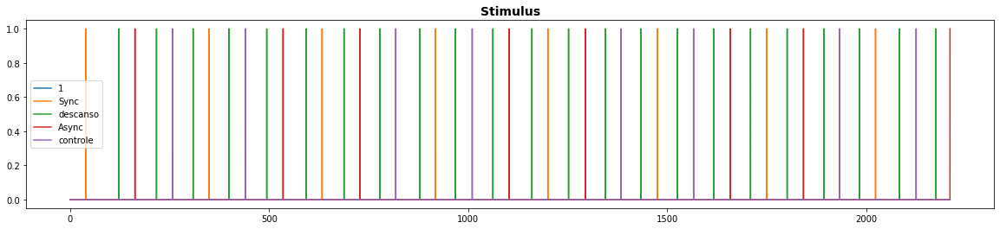

In [ ]:
plot_stimulus(stimulus)



In [ ]:
first = True

for nirs, data in all_nirs.items():
  # print(nirs, data)
  raw_sign_Series = data['raw'].drop(columns='time').min() > 0
  df_raw_sign = raw_sign_Series.to_frame(name='value').T
  df_raw_sign.index=[nirs]
  if first:
    raw_sign = df_raw_sign.copy()
    first = False
  else:
    if df_raw_sign.shape[1] == raw_sign.shape[1]:
      raw_sign = pd.concat([ raw_sign, df_raw_sign ])
    else:
      print('...Error, first nirs has ', raw_sign.shape[1], ' channels ', nirs , ' has ', df_raw_sign.shape[1], ' instead.')    
  # break 
raw_sign

,S1_D1_685,S1_D1_830,S1_D8_685,S1_D8_830,S1_D14_685,S1_D14_830,S2_D2_685,S2_D2_830,S2_D3_685,S2_D3_830,S2_D8_685,S2_D8_830,S2_D9_685,S2_D9_830,S2_D11_685,S2_D11_830,S3_D4_685,S3_D4_830,S3_D5_685,S3_D5_830,S3_D9_685,S3_D9_830,S3_D10_685,S3_D10_830,S3_D12_685,S3_D12_830,S4_D6_685,S4_D6_830,S4_D7_685,S4_D7_830,S4_D10_685,S4_D10_830,S4_D13_685,S4_D13_830,S5_D8_685,S5_D8_830,S5_D11_685,S5_D11_830,S5_D14_685,S5_D14_830,S5_D15_685,S5_D15_830,S6_D10_685,S6_D10_830,S6_D12_685,S6_D12_830,S6_D13_685,S6_D13_830
10_run2,True,True,True,True,True,True,False,False,False,False,True,True,False,True,True,True,False,False,False,False,False,False,False,False,False,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
11_run2,True,True,True,True,True,True,False,False,False,False,False,True,False,True,True,True,False,False,False,True,False,False,False,True,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
12_run2,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,True,True,True,False,True,False,True,False,False,False,True,True,True,True,True,False,True,False,True,True,True
13_run2,True,True,True,True,True,True,False,True,False,False,True,True,False,True,False,True,False,False,True,True,False,False,True,True,False,True,True,True,True,True,False,True,False,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
14_run2,True,True,True,True,True,True,False,True,False,False,True,True,False,True,False,True,False,False,False,False,False,False,False,False,True,True,True,True,False,False,False,True,False,True,True,True,True,True,True,True,True,True,False,True,True,True,True,True
15_run2,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,True,False,False,False,False,False,False,False,False,False,False,True,True,False,True,False,True,False,False,False,True,False,True,False,True,True,True,False,True,True,True,False,False
16_run2,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,True,False,True,False,False,False,True,False,False
17_run2,True,False,True,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,True,True,True,True,True,True,False,False,True,True,False,False
18_run2,True,False,True,False,True,False,False,True,False,False,False,True,True,True,False,True,False,True,False,True,False,True,True,True,False,True,True,True,True,True,True,True,True,True,True,True,False,True,True,True,True,True,True,True,True,True,True,True
19_run2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,True,True,False,True,False,False,False,False


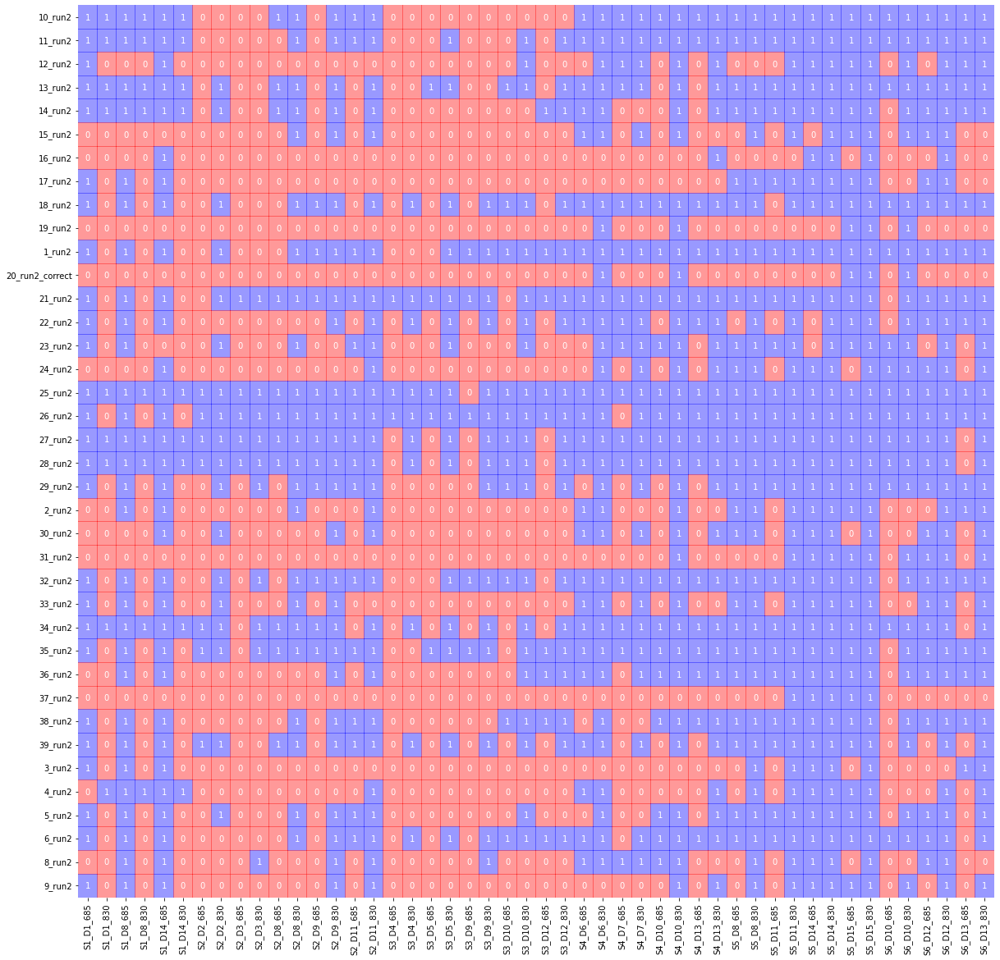

In [ ]:
plt.figure(figsize=(20,20))
import matplotlib.cm as cm

sns.heatmap(raw_sign,annot=True,cbar=False,cmap=cm.bwr_r,alpha=0.4)
plt.show()

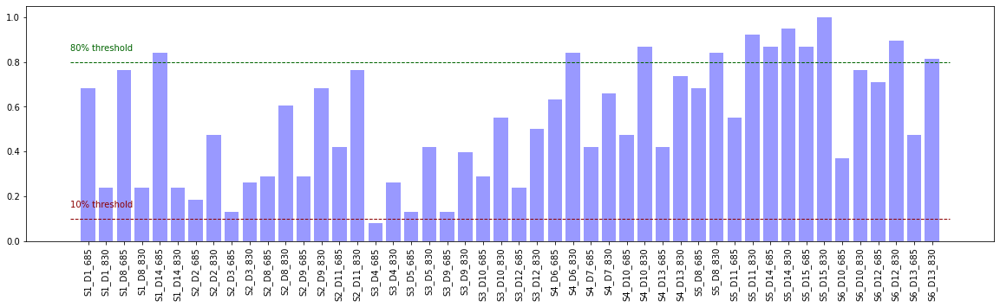

In [ ]:
plt.figure(figsize=(20,5))
import matplotlib.cm as cm

raw_sign_summary = raw_sign.sum() / len(raw_sign)
plt.bar(raw_sign_summary.index,raw_sign_summary,color=cm.bwr_r(1.0),alpha=0.4)
plt.xticks(rotation=90)
plt.hlines(0.1,0-1,len(raw_sign_summary),linestyles='dashed',lw=1,color='Darkred')
plt.text(0-1,0.15,'10% threshold',color='Darkred')
plt.hlines(0.80,0-1,len(raw_sign_summary),linestyles='dashed',lw=1,color='Darkgreen')
plt.text(0-1,0.85,'80% threshold',color='Darkgreen')
plt.show()

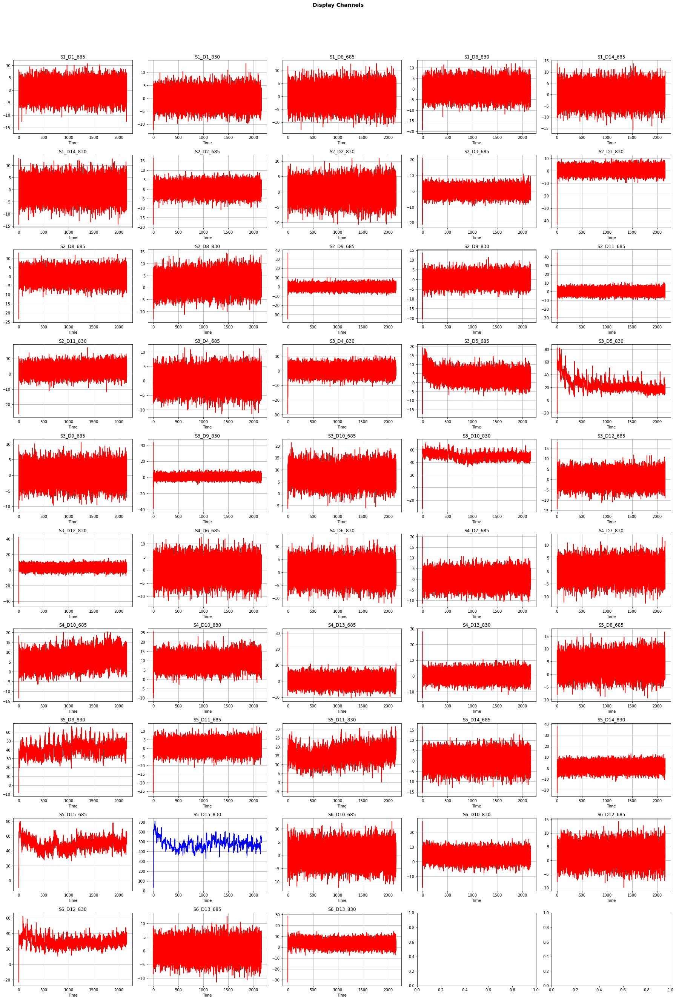

In [ ]:
plotchannels(all_nirs['27_run1']['raw'], ncols_display=5, title='Display Channels')

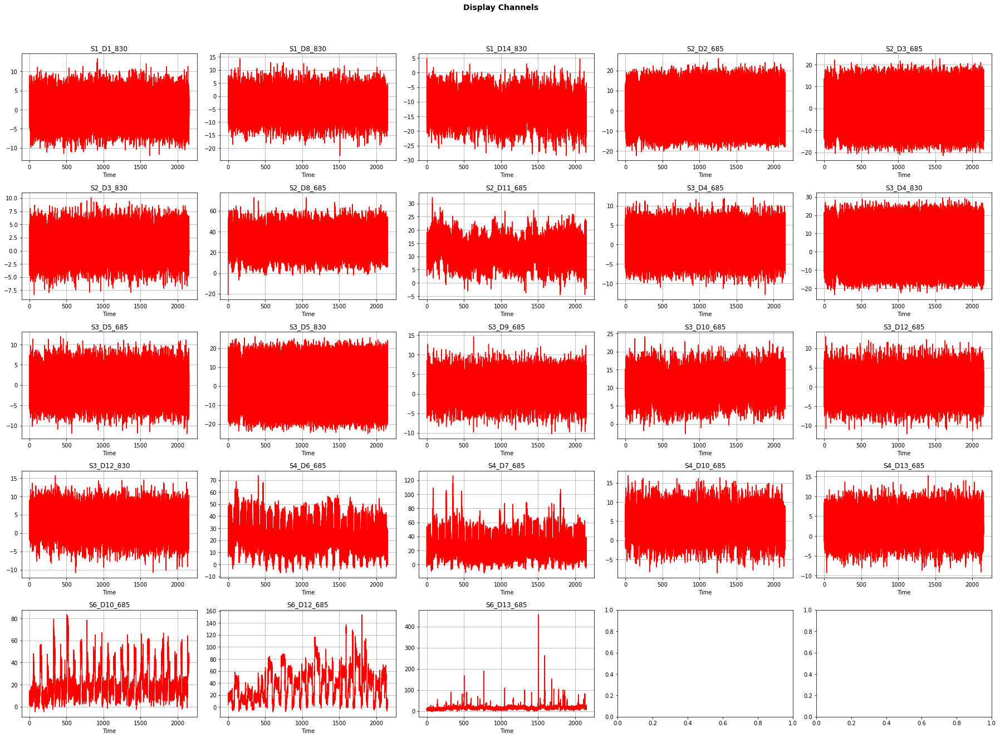

In [ ]:
df = all_nirs['12_run1']['raw'].copy()
df_red = df[[ c for c in df if df[c].min() < 0 ]].copy()
df_red['time'] = df['time'] 

plotchannels(df_red, ncols_display=5, title='Display Channels')

In [ ]:
[ c for c in df if df[c].min() < 0 ]

['S1_D1_830',
 'S1_D8_830',
 'S1_D14_830',
 'S2_D2_685',
 'S2_D3_685',
 'S2_D3_830',
 'S2_D8_685',
 'S2_D11_685',
 'S3_D4_685',
 'S3_D4_830',
 'S3_D5_685',
 'S3_D5_830',
 'S3_D9_685',
 'S3_D10_685',
 'S3_D12_685',
 'S3_D12_830',
 'S4_D6_685',
 'S4_D7_685',
 'S4_D10_685',
 'S4_D13_685',
 'S6_D10_685',
 'S6_D12_685',
 'S6_D13_685']

# Create channels

In [ ]:
channels = create_channels(mat)

channels  

,name,source,detector,wavelength,source_pos,detector_pos,source_pos_3D,detector_pos_3D
0,S1_D1_685,1,1,685,"(6.0, 0.0, 0.0)","(9.0, 0.0, 0.0)","(60.0, 50.0, 30.604644775390625)","(34.0, 66.63227653503418, 47.0)"
1,S1_D1_830,1,1,830,"(6.0, 0.0, 0.0)","(9.0, 0.0, 0.0)","(60.0, 50.0, 30.604644775390625)","(34.0, 66.63227653503418, 47.0)"
2,S1_D8_685,1,8,685,"(6.0, 0.0, 0.0)","(6.0, 3.0, 0.0)","(60.0, 50.0, 30.604644775390625)","(54.46846389770508, 31.0, 61.0)"
3,S1_D8_830,1,8,830,"(6.0, 0.0, 0.0)","(6.0, 3.0, 0.0)","(60.0, 50.0, 30.604644775390625)","(54.46846389770508, 31.0, 61.0)"
4,S1_D13_685,1,13,685,"(6.0, 0.0, 0.0)","(3.0, 0.0, 0.0)","(60.0, 50.0, 30.604644775390625)","(74.66044044494629, 32.0, 10.0)"
5,S1_D13_830,1,13,830,"(6.0, 0.0, 0.0)","(3.0, 0.0, 0.0)","(60.0, 50.0, 30.604644775390625)","(74.66044044494629, 32.0, 10.0)"
6,S2_D2_685,2,2,685,"(6.0, 6.0, 0.0)","(8.5, 4.5, 0.0)","(62.590572357177734, -5.0, 71.0)","(35.0, 15.635154724121094, 84.0)"
7,S2_D2_830,2,2,830,"(6.0, 6.0, 0.0)","(8.5, 4.5, 0.0)","(62.590572357177734, -5.0, 71.0)","(35.0, 15.635154724121094, 84.0)"
8,S2_D3_685,2,3,685,"(6.0, 6.0, 0.0)","(8.5, 7.5, 0.0)","(62.590572357177734, -5.0, 71.0)","(29.0, -51.0, 97.17919921875)"
9,S2_D3_830,2,3,830,"(6.0, 6.0, 0.0)","(8.5, 7.5, 0.0)","(62.590572357177734, -5.0, 71.0)","(29.0, -51.0, 97.17919921875)"


# Create raw

In [ ]:
raw = create_raw(mat, channels)

raw.head()

,time,S1_D1_685,S1_D1_830,S1_D8_685,S1_D8_830,S1_D13_685,S1_D13_830,S2_D2_685,S2_D2_830,S2_D3_685,S2_D3_830,S2_D8_685,S2_D8_830,S2_D9_685,S2_D9_830,S2_D10_685,S2_D10_830,S3_D5_685,S3_D5_830,S3_D6_685,S3_D6_830,S3_D11_685,S3_D11_830,S3_D12_685,S3_D12_830,S4_D8_685,S4_D8_830,S4_D13_685,S4_D13_830,S4_D14_685,S4_D14_830,S5_D4_685,S5_D4_830,S5_D5_685,S5_D5_830,S5_D6_685,S5_D6_830,S5_D7_685,S5_D7_830,S5_D15_685,S5_D15_830
0,0.0,3552.732178,3.114354,2687.039307,0.563323,8052.119629,-11.110871,15.228323,114.219810,-5.122965,5.170422,58.719860,158.920639,17.434908,61.514187,38.639126,129.593796,37.411507,255.525604,66.077850,486.784668,40.662220,299.811005,241.137482,1757.805420,946.945435,3065.847656,2232.182373,10140.346680,1193.978027,5738.440430,646.560608,5015.590820,11.308493,134.679047,618.998718,4447.228516,576.533142,4001.497559,262.207031,2057.677246
1,0.1,3534.510010,2.608408,2683.685303,-4.122843,8021.365234,-3.729129,12.832397,105.382187,-2.354175,-3.886332,61.792572,153.601440,16.922155,56.189674,40.406635,128.199921,45.877350,251.516541,63.032017,481.160461,44.416637,300.949921,240.355164,1728.795044,939.385193,3021.589111,2233.124023,10095.448242,1172.503662,5594.989258,645.781616,4973.395020,19.937004,129.295547,612.315491,4348.259277,574.678833,3961.950928,258.957001,2022.920898
2,0.2,3528.994385,-0.728408,2679.033447,-10.716757,8005.879883,-9.519560,23.827265,112.550331,4.222748,-5.185591,52.468555,156.365097,13.880645,53.494816,33.880844,128.604843,43.991867,251.033722,67.515808,480.696777,40.545940,291.109985,239.618103,1738.244629,939.163635,3029.510254,2226.185791,10069.282227,1173.506226,5620.333984,644.802673,4994.067383,19.042864,130.631042,612.071411,4365.458496,572.003235,3966.580322,262.733459,2040.238525
3,0.3,3534.748535,1.925646,2677.090820,-1.440320,8018.927246,-7.889009,20.027231,110.251907,4.400818,2.056794,51.725113,145.879166,15.822170,55.044868,36.977943,127.469360,38.797333,252.330841,65.212769,473.850708,37.421684,293.399567,244.928680,1736.252563,937.908020,3028.190430,2230.804932,10065.060547,1183.061035,5627.797363,652.999817,4987.871094,14.751101,131.607605,612.930786,4376.956055,569.545044,3946.086670,255.693985,2043.439087
4,0.4,3545.741455,-0.200681,2684.652344,-7.743103,8032.176758,-16.169569,21.978102,110.752892,-3.966592,1.510626,56.732452,151.175018,17.428452,55.276726,34.709915,130.375778,48.979847,253.981552,66.279442,483.068573,40.943184,286.577942,239.817886,1738.737915,939.619202,3036.262207,2224.646973,10080.823242,1182.164795,5666.166504,653.796204,4992.700195,14.357680,134.563614,616.945251,4394.384766,567.628723,3944.551270,263.238373,2036.607788


# Create Stimulus

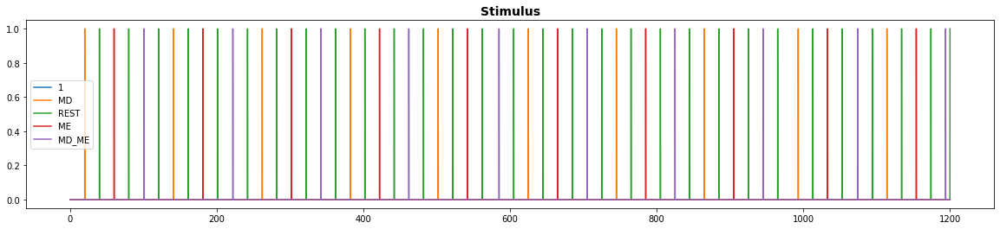

,time,1,MD,REST,ME,MD_ME
0,0.0,0,0,0,0,0
1,0.1,0,0,0,0,0
2,0.2,0,0,0,0,0
3,0.3,0,0,0,0,0
4,0.4,0,0,0,0,0


In [ ]:
stimulus = create_stimulus(mat)

plot_stimulus(stimulus)
stimulus.head()

# Create & download files

In [ ]:
# create_download_files(channels, file)  
create_download_files(raw, file)  
create_download_files(stimulus, file)  


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Downloading... /content/ana_raw.xlsx


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Downloading... /content/ana_stimulus.xlsx


# Formato `.nirs`

*Fonte: [Homer2_UserGuide](https://www.nmr.mgh.harvard.edu/martinos/software/homer/HOMER2_UsersGuide_121129.pdf)*

<br>

`t` - This variable is the data time points array. It contains the data acquisition times. The dimensions of this array
are <number of time points> by 1.

`d` - This variable is the raw intensity time course. It is a 2D array where each element in row i, column j contains
the raw intensity at time point i, in channel j. The dimensions of this array are <number of time points> by
<number of measurement channels>

`SD` - This is a structured variable containing the source/detector geometry. It has the following fields:

> `Lambda` - Wavelengths used for data acquisition; dimensions <number of wavelengths> by 1

> `nSrcs` - Number of lasers; scalar variable

> `nDets`- Number of detectors; scalar variable

> `SrcPos` - Array of probe coordinates of the lasers; dimensions <number of lasers> by 3

> `DetPos` - Array of probe coordinates of the detectors; dimensions <number of detectors> by 3

> `MeasList` - List of source/detector/wavelength measurement channels. It’s an array with dimensions, <number of channels> by 4. The meaning of the 4 columns are as follows:

>> Column 1 index of the source from the SD.SrcPos list.

>>  Column 2 index of the detector from the SD.DetPos list.

>>  Column 3 is unused right now and contains all ones.

>>  Column 4 index of the wavelength from SD.Lambda.

`s` - This variable specifies the time points and condition of stimulus onsets. Conditions are a way to separate
stimuli into different groups, where each group is averaged independently of stimuli belonging to other
conditions. Initially the values in s are binary; 1 at time point i designating stimulus onset, 0 designating no
stimulus at time point i. The dimensions of s are <number of time points> by <number of
conditions>.

`ml` - List of source-detector channels. This is a duplicate of the SD.MeasList above.

`aux` - auxiliary signal of same dimensions as t. 

`CondNames` - a list of condition names used for the stimulus marks 

`tIncMan` -  Manual time exclusion
 
`SD.MeasListAct` - Manual channel pruning 

`s0` - The s matrix is modified as a result of stimulus mark exclusion, deletion or addition of new stimulus marks. If the s matrix is changed in any way, the original s matrix is saved in s0. 

The following additional parameters will be saved in the .nirs files as a result of data processing: 

`procInput` - This variable contains the processing stream functions, their parameters and values used to process data.

`procResult` - Contains the results of processing including optical density, concentration, optical density and concentration averages, and any other variables that are the  result of executing the processing stream.  



In [ ]:
path = '/content/drive/MyDrive/fNIRS - análises compartilhadas/5. Dados de Finger Tapping 2'
file = 'ana.nirs'

mat = load_nirs(path, file)

mat.keys()

dict_keys(['__header__', '__version__', '__globals__', 'CondNames', 'ans', 'aux', 'brainsight', 'd', 'ml', 's0', 't', 'procInput', 'userdata', 'procResult', 'SD', 's', 'tIncMan'])

`t` - This variable is the data time points array. It contains the data acquisition times. The dimensions of this array
are <number of time points> by 1.

In [ ]:
print( mat['t'].shape, '\n\n', mat['t'] )

(12201, 1) 

 [[0.00000000e+00]
 [1.00000001e-01]
 [2.00000003e-01]
 ...
 [1.21980005e+03]
 [1.21990002e+03]
 [1.22000000e+03]]


`d` - This variable is the raw intensity time course. It is a 2D array where each element in row i, column j contains
the raw intensity at time point i, in channel j. The dimensions of this array are <number of time points> by
<number of measurement channels>

In [ ]:
print( mat['d'].shape, '\n\n', mat['d'] )

(12201, 40) 

 [[-1.61307883e+00 -4.41529036e+00 -1.69386733e+00 ...  3.25636780e+02
   5.13639221e+01  6.59777161e+02]
 [ 2.01356554e+00  8.73393416e-01  4.70728302e+00 ...  4.10270508e+02
   6.79504547e+01  7.23516785e+02]
 [ 4.58463371e-01  4.81897879e+00  2.33773515e-01 ...  4.16588898e+02
   6.71219482e+01  7.36304688e+02]
 ...
 [-4.74421787e+00  1.09265268e+00  5.91088438e+00 ...  4.02792938e+02
   6.12438164e+01  7.55697144e+02]
 [ 1.08703482e+00 -4.47931910e+00 -1.38947582e+00 ...  4.01285797e+02
   6.06569672e+01  7.53893188e+02]
 [-1.26406562e+00  4.05041027e+00  5.25978374e+00 ...  3.97015106e+02
   6.08106537e+01  7.48290710e+02]]


`SD` - This is a structured variable containing the source/detector geometry. It has the following fields:

> `Lambda` - Wavelengths used for data acquisition; dimensions <number of wavelengths> by 1

> `nSrcs` - Number of lasers; scalar variable

> `nDets`- Number of detectors; scalar variable

> `SrcPos` - Array of probe coordinates of the lasers; dimensions <number of lasers> by 3

> `DetPos` - Array of probe coordinates of the detectors; dimensions <number of detectors> by 3

> `MeasList` - List of source/detector/wavelength measurement channels. It’s an array with dimensions, <number of channels> by 4. The meaning of the 4 columns are as follows:

>> Column 1 index of the source from the SD.SrcPos list.

>>  Column 2 index of the detector from the SD.DetPos list.

>>  Column 3 is unused right now and contains all ones.

>>  Column 4 index of the wavelength from SD.Lambda.

In [ ]:
print( mat['SD'][0].dtype.names )

('Lambda', 'nSrcs', 'nDets', 'SrcPos3D', 'SrcPos', 'DetPos3D', 'DetPos', 'MeasList', 'SpatialUnit', 'xmin', 'xmax', 'ymin', 'ymax', 'MeasListAct', 'MeasListVis')


In [ ]:
def SD(name):
  sd = mat['SD'][0,0][list(mat['SD'][0].dtype.names).index(name)]
  return sd  

In [ ]:
print('lambda: ', SD('Lambda')[0])

lambda:  [685 830]


In [ ]:
print('nSrcs: ', SD('nSrcs')[0], 'nDets: ', SD('nDets')[0])

nSrcs:  [5] nDets:  [15]


In [ ]:
print('SrcPos: \n', SD('SrcPos'), '\n\n',  'DetPos: \n', SD('DetPos'))

SrcPos: 
 [[ 6.   0.   0. ]
 [ 6.   6.   0. ]
 [13.5  6.   0. ]
 [ 3.   3.   0. ]
 [13.5  3.   0. ]] 

 DetPos: 
 [[ 9.   0.   0. ]
 [ 8.5  4.5  0. ]
 [ 8.5  7.5  0. ]
 [13.5  0.   0. ]
 [13.5  3.   0. ]
 [16.5  3.   0. ]
 [15.5  0.   0. ]
 [ 6.   3.   0. ]
 [ 6.   9.   0. ]
 [ 3.   6.   0. ]
 [15.   8.5  0. ]
 [16.5  6.   0. ]
 [ 3.   0.   0. ]
 [ 0.   3.   0. ]
 [10.5  3.   0. ]]


In [ ]:
print('MeasList shape: \n', SD('MeasList').shape, '\n\n', 'MeasList: \n', SD('MeasList'))

MeasList shape: 
 (40, 4) 

 MeasList: 
 [[ 1  1  1  1]
 [ 1  1  1  2]
 [ 1  8  1  1]
 [ 1  8  1  2]
 [ 1 13  1  1]
 [ 1 13  1  2]
 [ 2  2  1  1]
 [ 2  2  1  2]
 [ 2  3  1  1]
 [ 2  3  1  2]
 [ 2  8  1  1]
 [ 2  8  1  2]
 [ 2  9  1  1]
 [ 2  9  1  2]
 [ 2 10  1  1]
 [ 2 10  1  2]
 [ 3  5  1  1]
 [ 3  5  1  2]
 [ 3  6  1  1]
 [ 3  6  1  2]
 [ 3 11  1  1]
 [ 3 11  1  2]
 [ 3 12  1  1]
 [ 3 12  1  2]
 [ 4  8  1  1]
 [ 4  8  1  2]
 [ 4 13  1  1]
 [ 4 13  1  2]
 [ 4 14  1  1]
 [ 4 14  1  2]
 [ 5  4  1  1]
 [ 5  4  1  2]
 [ 5  5  1  1]
 [ 5  5  1  2]
 [ 5  6  1  1]
 [ 5  6  1  2]
 [ 5  7  1  1]
 [ 5  7  1  2]
 [ 5 15  1  1]
 [ 5 15  1  2]]


`s` - This variable specifies the time points and condition of stimulus onsets. Conditions are a way to separate
stimuli into different groups, where each group is averaged independently of stimuli belonging to other
conditions. Initially the values in s are binary; 1 at time point i designating stimulus onset, 0 designating no
stimulus at time point i. The dimensions of s are <number of time points> by <number of
conditions>.

In [ ]:
mat['s']

array([[0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       ...,
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0]], dtype=uint8)

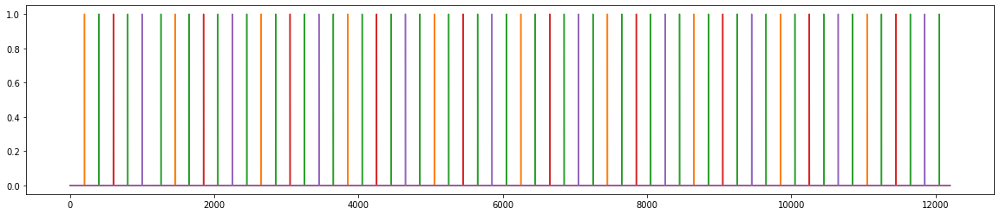

In [ ]:
plt.figure(figsize=(20,4))
plt.plot(mat['s'])
plt.show()

In [ ]:
mat['CondNames'][0]

array([array(['1'], dtype='<U1'), array(['MD'], dtype='<U2'),
       array(['REST'], dtype='<U4'), array(['ME'], dtype='<U2'),
       array(['MD_ME'], dtype='<U5')], dtype=object)

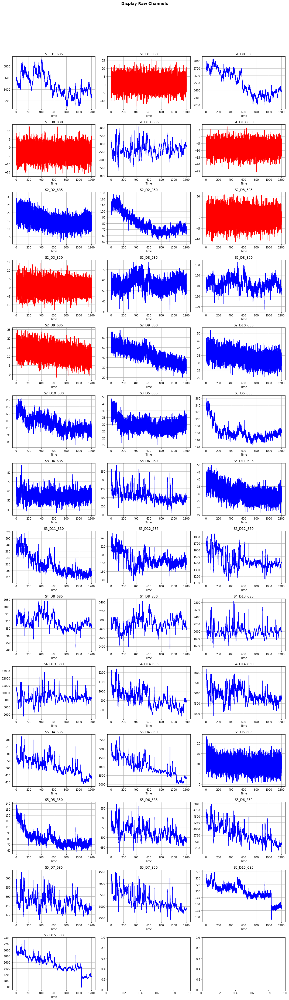

In [ ]:
plotchannels(raw)

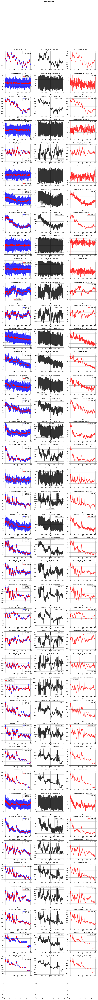

In [ ]:
df_filter(raw, cutoff=0.8, fs=30, order=5, title='Filtered Data')

In [ ]:
import matplotlib.cm as cm

def df_filter_and_stimulus(df, cutoff=0.8, fs=30, order=5, title='Filtered Data'): 

  nr_channels = len(df.columns)
  ncols= 1
  nrows= nr_channels

  fig, ax = plt.subplots(nrows=nrows, ncols=ncols, sharex=False, sharey=False, figsize=(ncols*20,nrows*6))

  i = 0
  for c in df.drop(columns=['time']):
    # y_cutted = remove_outlier(df,c)[c]
    y_filtered = butter_lowpass_filter(df[c], cutoff=cutoff, fs=fs, order=order)

    # ax[i].plot(df.time, df[c], 'b-', label='raw data', alpha=0.4)
    ax[i].plot(df.time, y_filtered, 'r-', lw=1) # , label='filtered data')
    
    color = 0
    for s in stimulus.drop(columns=['time']):
      ax[i].vlines(stimulus.iloc[ stimulus[ stimulus[s] == 1 ][s].index ], y_filtered.min(), y_filtered.max(),label=s,lw=1, linestyle='dashed',
                   color=['r','k','m','g','c','y','b'][color])
      color = color + 1
      # print(stimulus[c])

    ax[i].set_title('Channel ' + str(c) + ', Filtered Data with Stimulus')
    ax[i].set_xlabel('Time')
    # ax[i].grid()
    ax[i].legend()

    i=i+1

  plt.suptitle(title, fontsize=14, weight='bold', y=1.05)

  plt.tight_layout()
  plt.show()

  return  

# df_filter_and_stimulus(raw[['time','S1_D1_685']], cutoff=0.8, fs=30, order=5, title='Filtered Data')  

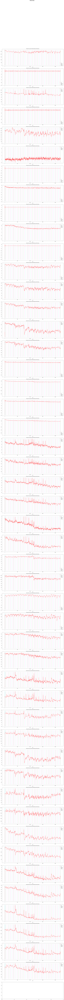

In [ ]:
df_filter_and_stimulus(raw, cutoff=0.8, fs=30, order=5, title='Filtered Data')  

In [ ]:
stimulus.head()

,time,1,MD,REST,ME,MD_ME
0,0.0,0,0,0,0,0
1,0.1,0,0,0,0,0
2,0.2,0,0,0,0,0
3,0.3,0,0,0,0,0
4,0.4,0,0,0,0,0


In [ ]:
stimulus.iloc[ stimulus[ stimulus['MD'] == 1 ]['MD'].index ]


,time,1,MD,REST,ME,MD_ME
200,20.0,0,1,0,0,0
1410,141.0,0,1,0,0,0
2620,262.0,0,1,0,0,0
3820,382.0,0,1,0,0,0
5020,502.0,0,1,0,0,0
6250,625.0,0,1,0,0,0
7450,745.0,0,1,0,0,0
8650,865.0,0,1,0,0,0
9930,993.0,0,1,0,0,0
11140,1114.0,0,1,0,0,0


In [ ]:
for row in mat['s']:
  if row.sum() !=0:
    print(row)

[0 1 0 0 0]
[0 0 1 0 0]
[0 0 0 1 0]
[0 0 1 0 0]
[0 0 0 0 1]
[0 0 1 0 0]
[0 1 0 0 0]
[0 0 1 0 0]
[0 0 0 1 0]
[0 0 1 0 0]
[0 0 0 0 1]
[0 0 1 0 0]
[0 1 0 0 0]
[0 0 1 0 0]
[0 0 0 1 0]
[0 0 1 0 0]
[0 0 0 0 1]
[0 0 1 0 0]
[0 1 0 0 0]
[0 0 1 0 0]
[0 0 0 1 0]
[0 0 1 0 0]
[0 0 0 0 1]
[0 0 1 0 0]
[0 1 0 0 0]
[0 0 1 0 0]
[0 0 0 1 0]
[0 0 1 0 0]
[0 0 0 0 1]
[0 0 1 0 0]
[0 1 0 0 0]
[0 0 1 0 0]
[0 0 0 1 0]
[0 0 1 0 0]
[0 0 0 0 1]
[0 0 1 0 0]
[0 1 0 0 0]
[0 0 1 0 0]
[0 0 0 1 0]
[0 0 1 0 0]
[0 0 0 0 1]
[0 0 1 0 0]
[0 1 0 0 0]
[0 0 1 0 0]
[0 0 0 1 0]
[0 0 1 0 0]
[0 0 0 0 1]
[0 0 1 0 0]
[0 1 0 0 0]
[0 0 1 0 0]
[0 0 0 1 0]
[0 0 1 0 0]
[0 0 0 0 1]
[0 0 1 0 0]
[0 1 0 0 0]
[0 0 1 0 0]
[0 0 0 1 0]
[0 0 1 0 0]
[0 0 0 0 1]
[0 0 1 0 0]


In [ ]:
mat['CondNames'][0]

array([array(['1'], dtype='<U1'), array(['MD'], dtype='<U2'),
       array(['REST'], dtype='<U4'), array(['ME'], dtype='<U2'),
       array(['MD_ME'], dtype='<U5')], dtype=object)

In [ ]:
mat['s'].sum()

60

In [ ]:
mat['t']

array([[0.00000000e+00],
       [1.00000001e-01],
       [2.00000003e-01],
       ...,
       [1.21980005e+03],
       [1.21990002e+03],
       [1.22000000e+03]])

In [ ]:
mat['d'].shape

(12201, 40)

In [ ]:
mat['aux'][:,0]

array([2.55828857, 3.77929688, 3.7789917 , ..., 3.77319336, 3.77349854,
       3.77349854])

In [ ]:
mat['brainsight']

array([[(array([[4]], dtype=uint32), array([[(array([[(array([[4]], dtype=uint32), array([[8]], dtype=uint32), array([[4],
       [4],
       [4],
       [4]], dtype=uint32), array([[2],
       [2],
       [2],
       [2]], dtype=uint32), array([[8],
       [8],
       [8],
       [8]], dtype=uint32), array([[4],
       [4],
       [4],
       [4]], dtype=uint32), array([[3840],
       [3840],
       [3840],
       [3840]], dtype=uint32), array([[685, 830],
       [685, 830],
       [685, 830],
       [685, 830]], dtype=uint32), array(['NIRSOPM80102-00053', 'NIRSOPM80102-00054', 'NIRSOPM80102-00055',
       'NIRSOPM80102-00056'], dtype='<U18'), array(['NIRSCPU320101-00014'], dtype='<U19'), array([[1]], dtype=uint8), array([[0]], dtype=uint8))]],
      dtype=[('numberOfOpticalBays', 'O'), ('numberOfAuxiliaryChannels', 'O'), ('sourcesPerBlock', 'O'), ('wavelengthsPerBlock', 'O'), ('detectorsPerBlock', 'O'), ('proximityDetectorsPerBlock', 'O'), ('proximityDetectorFlags', 'O'), ('wavelengt

In [ ]:
mat['brainsight'][0,0][list(mat['brainsight'][0].dtype.names).index('acquisitionDate')]

array(['n/a'], dtype='<U3')

In [ ]:
mat['brainsight'][0].dtype.names

('version', 'parameters', 'acquisition', 'createdBy', 'acquisitionDate')

In [ ]:
print( mat['brainsight'][0,0][list(mat['brainsight'][0].dtype.names).index('parameters')] )

[[(array([[(array([[4]], dtype=uint32), array([[8]], dtype=uint32), array([[4],
       [4],
       [4],
       [4]], dtype=uint32), array([[2],
       [2],
       [2],
       [2]], dtype=uint32), array([[8],
       [8],
       [8],
       [8]], dtype=uint32), array([[4],
       [4],
       [4],
       [4]], dtype=uint32), array([[3840],
       [3840],
       [3840],
       [3840]], dtype=uint32), array([[685, 830],
       [685, 830],
       [685, 830],
       [685, 830]], dtype=uint32), array(['NIRSOPM80102-00053', 'NIRSOPM80102-00054', 'NIRSOPM80102-00055',
       'NIRSOPM80102-00056'], dtype='<U18'), array(['NIRSCPU320101-00014'], dtype='<U19'), array([[1]], dtype=uint8), array([[0]], dtype=uint8))]],
      dtype=[('numberOfOpticalBays', 'O'), ('numberOfAuxiliaryChannels', 'O'), ('sourcesPerBlock', 'O'), ('wavelengthsPerBlock', 'O'), ('detectorsPerBlock', 'O'), ('proximityDetectorsPerBlock', 'O'), ('proximityDetectorFlags', 'O'), ('wavelengths', 'O'), ('serialNumbers', 'O'), ('system

In [ ]:
mat['CondNames']

array([[array(['1'], dtype='<U1'), array(['MD'], dtype='<U2'),
        array(['REST'], dtype='<U4'), array(['ME'], dtype='<U2'),
        array(['MD_ME'], dtype='<U5')]], dtype=object)

In [ ]:
mat['CondNames'].shape 

(1, 5)

In [ ]:
mat['CondNames']

array([[array(['1'], dtype='<U1'), array(['MD'], dtype='<U2'),
        array(['REST'], dtype='<U4'), array(['ME'], dtype='<U2'),
        array(['MD_ME'], dtype='<U5')]], dtype=object)

In [ ]:
mat['SD'][0].dtype

dtype([('Lambda', 'O'), ('nSrcs', 'O'), ('nDets', 'O'), ('SrcPos3D', 'O'), ('SrcPos', 'O'), ('DetPos3D', 'O'), ('DetPos', 'O'), ('MeasList', 'O'), ('SpatialUnit', 'O'), ('xmin', 'O'), ('xmax', 'O'), ('ymin', 'O'), ('ymax', 'O'), ('MeasListAct', 'O'), ('MeasListVis', 'O')])

In [ ]:
a = mat['SD'][0].dtype 

In [ ]:
a.names

('Lambda',
 'nSrcs',
 'nDets',
 'SrcPos3D',
 'SrcPos',
 'DetPos3D',
 'DetPos',
 'MeasList',
 'SpatialUnit',
 'xmin',
 'xmax',
 'ymin',
 'ymax',
 'MeasListAct',
 'MeasListVis')

In [ ]:
mat['SD'][0,0][list(mat['SD'][0].dtype.names).index('MeasList')]

array([[ 1,  1,  1,  1],
       [ 1,  1,  1,  2],
       [ 1,  8,  1,  1],
       [ 1,  8,  1,  2],
       [ 1, 13,  1,  1],
       [ 1, 13,  1,  2],
       [ 2,  2,  1,  1],
       [ 2,  2,  1,  2],
       [ 2,  3,  1,  1],
       [ 2,  3,  1,  2],
       [ 2,  8,  1,  1],
       [ 2,  8,  1,  2],
       [ 2,  9,  1,  1],
       [ 2,  9,  1,  2],
       [ 2, 10,  1,  1],
       [ 2, 10,  1,  2],
       [ 3,  5,  1,  1],
       [ 3,  5,  1,  2],
       [ 3,  6,  1,  1],
       [ 3,  6,  1,  2],
       [ 3, 11,  1,  1],
       [ 3, 11,  1,  2],
       [ 3, 12,  1,  1],
       [ 3, 12,  1,  2],
       [ 4,  8,  1,  1],
       [ 4,  8,  1,  2],
       [ 4, 13,  1,  1],
       [ 4, 13,  1,  2],
       [ 4, 14,  1,  1],
       [ 4, 14,  1,  2],
       [ 5,  4,  1,  1],
       [ 5,  4,  1,  2],
       [ 5,  5,  1,  1],
       [ 5,  5,  1,  2],
       [ 5,  6,  1,  1],
       [ 5,  6,  1,  2],
       [ 5,  7,  1,  1],
       [ 5,  7,  1,  2],
       [ 5, 15,  1,  1],
       [ 5, 15,  1,  2]],

In [ ]:
mat['aux'][:,0]

array([2.55828857, 3.77929688, 3.7789917 , ..., 3.77319336, 3.77349854,
       3.77349854])

In [ ]:
mat['brainsight'][0][0][1]

array([[(array([[(array([[4]], dtype=uint32), array([[8]], dtype=uint32), array([[4],
       [4],
       [4],
       [4]], dtype=uint32), array([[2],
       [2],
       [2],
       [2]], dtype=uint32), array([[8],
       [8],
       [8],
       [8]], dtype=uint32), array([[4],
       [4],
       [4],
       [4]], dtype=uint32), array([[3840],
       [3840],
       [3840],
       [3840]], dtype=uint32), array([[685, 830],
       [685, 830],
       [685, 830],
       [685, 830]], dtype=uint32), array(['NIRSOPM80102-00053', 'NIRSOPM80102-00054', 'NIRSOPM80102-00055',
       'NIRSOPM80102-00056'], dtype='<U18'), array(['NIRSCPU320101-00014'], dtype='<U19'), array([[1]], dtype=uint8), array([[0]], dtype=uint8))]],
      dtype=[('numberOfOpticalBays', 'O'), ('numberOfAuxiliaryChannels', 'O'), ('sourcesPerBlock', 'O'), ('wavelengthsPerBlock', 'O'), ('detectorsPerBlock', 'O'), ('proximityDetectorsPerBlock', 'O'), ('proximityDetectorFlags', 'O'), ('wavelengths', 'O'), ('serialNumbers', 'O'), ('

In [ ]:
!pip install colorama

In [ ]:
import os
import mne

from mne.io import read_raw_nirx, read_raw_snirf
from mne_nirs.io import write_raw_snirf
from numpy.testing import assert_allclose

ModuleNotFoundError: ignored

In [ ]:
fnirs_data_folder = mne.datasets.fnirs_motor.data_path('/content/drive/MyDrive/fNIRS - análises compartilhadas/DATA_MotorNeuron')
fnirs_raw_dir = os.path.join(fnirs_data_folder, 'SUBJID_6082')
raw_intensity = read_raw_nirx(fnirs_raw_dir).load_data()

# Read `snirf` file

`nme-nirs` suporta dentre outros arquivos: 

```
read_raw_boxy
read_raw_brainvision
read_raw_nirx
read_raw_snirf
```

Mas não suporta arquivos `.nirs`. 



# **TO DO**

> * Verificar a possibilidade de empregar arquivos `read_raw_brainvision` diretamente
> * Verificar a possibilidade de conversão de arquivos dos diferentes formatos, em especial `read_raw_.nirs` $\leftrightarrow$ `read_raw_.snirf` $\leftrightarrow$  `read_raw_brainvision` 


In [ ]:
for method in dir(mne.io):
  if 'read_raw' in method:
    print(method)

## Read `.snirf` data

In [ ]:
file_in = '/content/drive/MyDrive/fNIRS - análises compartilhadas/DadosOutroGrupo/2019-02-14_001.snirf'
# file_in = '/content/drive/MyDrive/fNIRS - análises compartilhadas/BIDS-NIRS-Tapping-v0.0.1/rob-luke-BIDS-NIRS-Tapping-388d2cd/sub-01/nirs/sub-01_task-tapping_nirs.snirf'
# file_in = '/content/drive/MyDrive/fNIRS - análises compartilhadas/DATA_MotorNeuron/SUBJID_6082/run1.snirf'

# ValueError: sfreq must be positive
# file_in = '/content/drive/MyDrive/fNIRS - análises compartilhadas/5. Dados de Finger Tapping 2/ana.snirf' 

raw_intensity = mne.io.read_raw_snirf(file_in, verbose=True)

raw_intensity.load_data()

## Convert to Dataframe

Isso é útil para trabalhar com os dados de forma tabular.

In [ ]:
df = raw_intensity.to_data_frame()

In [ ]:
df.head()

## Inspeção inicial dos Dados

In [ ]:
print('\nNúmero de Canais:'.ljust(35), df.shape[1] - 1)

max_measure = df.iloc[0::,1::].max().max()
min_measure = df.iloc[0::,1::].min().min()
print('\nIntervalo das medidas:'.ljust(35), min_measure, max_measure)

print('\nCanais por prefixo (source):'.ljust(35))
list_prefix_channels = [x[0:x.find('_')] for x in df.columns[1::]]
summary_prefix_channels = {}
summary_prefix_channels_list = {}
for c in list_prefix_channels:
  if c not in summary_prefix_channels.keys():  
    summary_prefix_channels[c] = list_prefix_channels.count(c)
    summary_prefix_channels_list[c] = [x for x in df.columns[1::] if c+'_' in x]

for c in summary_prefix_channels.keys():  
    print(34*' ',c, summary_prefix_channels[c], '\t', summary_prefix_channels_list[c])

print('\nCanais por sufixo (wave length):'.ljust(30))
list_suffix_channels = [x[x.find(' ')+1::] for x in df.columns[1::]]
summary_suffix_channels = {}
for c in list_suffix_channels:
  if c not in summary_suffix_channels.keys():  
    summary_suffix_channels[c] = list_suffix_channels.count(c)
    print(34*' ',c, summary_suffix_channels[c])
  
print('\nTimes:'.ljust(35), df.shape[0])

print('\nElapse times:'.ljust(30))
for i in range(len(df.time.diff()[1::].value_counts())):
  print(34*' ', df.time.diff()[1::].value_counts().index[i], df.time.diff()[1::].value_counts().values[i])



In [ ]:
for s in summary_prefix_channels.keys(): 
  fig, ax = plt.subplots(nrows=1, ncols=8, sharex=True, sharey=True,figsize=(24,3))
  i = 0
  for c in summary_prefix_channels_list[s]:
    ax[i].plot(df.index, df[c])
    ax[i].set_title(c, fontsize=16, weight='bold')
    i = i + 1
    plt.xticks([])
    plt.ylim([min_measure, max_measure])

    if i >= 8: 
      print('Warning: Há mais de 8 detectores para a mesma fonte')
      break
 
  plt.tight_layout()
  plt.show()


In [ ]:
colunas = 4
linhas = int( len( summary_prefix_channels.keys() ) / colunas )

fig, ax = plt.subplots(nrows=linhas, ncols=colunas, sharex=True, sharey=True,figsize=(4*linhas,4*colunas))
i = 0
for s in summary_prefix_channels.keys(): 
  for c in summary_prefix_channels_list[s]:
    ax[i//colunas, i%colunas].plot(df.index, df[c], label=c)
  ax[i//colunas, i%colunas].set_title(s, fontsize=16, weight='bold')
  ax[i//colunas, i%colunas].legend(fontsize=8)
  plt.xticks([])
  plt.ylim([min_measure, max_measure])
  i = i + 1 
  
plt.tight_layout()
plt.show()

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=1, sharex=True, figsize=(16,12))

i = 0
for s in summary_prefix_channels.keys(): 
  for c in summary_prefix_channels_list[s]:
    ax[0].boxplot(df[c], positions=[i])
    ax[1].boxplot(df[c] / df[c].max(), positions=[i])
    ax[2].boxplot(( df[c] - df[c].mean() ) / df[c].std(), positions=[i])
    i = i + 1

ax[0].set_title('Absolute Values',fontsize=14,weight='bold')    
ax[1].set_title('Normalized Values',fontsize=14,weight='bold') 
ax[2].set_title('z-Score Values',fontsize=14,weight='bold') 

ax[2].set_xticks(ticks=np.arange(0,96))
ax[2].set_xticklabels(labels=df.columns[1::],rotation=60,fontsize=7)

plt.tight_layout()
plt.show()

In [ ]:
s = input('Entre com um conjunto de canais ou enter para o primeiro conjunto: ')
if s == '': s = list( summary_prefix_channels.keys() )[0]

fig, ax = plt.subplots(nrows=1, ncols=2, sharex=True, figsize=(16,4))

i = 0
for c in summary_prefix_channels_list[s]:
  ax[0].plot(df.index, df[c] , label=c)
  ax[1].plot(df.index, ( df[c] - df[c].mean() ) / df[c].std() + i*2, label=c)
  i = i + 1

ax[0].set_title(s + ' raw signals', fontsize=16, weight='bold')
ax[0].legend(fontsize=8)

ax[1].set_title(s + ' z-score + i', fontsize=16, weight='bold')
ax[1].legend(fontsize=8)

plt.tight_layout()
plt.show()

# Obtendo os eventos

In [ ]:
for i in range(len(raw_intensity.annotations)):
  print(raw_intensity.annotations[i])

In [ ]:
events = {}
for a in raw_intensity.annotations:
  if a['description'] not in events.keys():
    events[a['description']] = []
  events[a['description']].append(a['onset'])  

events

In [ ]:
plt.figure(figsize=(16,4))

s = input('Entre com um conjunto de canais ou enter para o primeiro conjunto: ')
if s == '': s = list( summary_prefix_channels.keys() )[0]

for c in summary_prefix_channels_list[s]:
  plt.plot(df.index, df[c], label=c)
plt.title(s, fontsize=16, weight='bold')
plt.legend(fontsize=8)

# print(plt.gca().get_ylim()) # min and max values in y axis
lim = plt.gca().get_ylim()
colors = 'brgcmyk' # até 7 diferentes eventos

i = 0
for e, t_list in events.items():
  i = i + 1
  for t in t_list:
    plt.vlines(t*10,lim[0],lim[1],colors=colors[i-1],linestyles='dotted')

plt.tight_layout()
plt.show()

In [ ]:
plt.figure(figsize=(16,4))

c = input('Entre com um canais ou enter para o primeiro canal: ')
if c == '': c = df.columns[1] 

plt.plot(df.index, df[c])
plt.title(c, fontsize=16, weight='bold')

# print(plt.gca().get_ylim()) # min and max values in y axis
lim = plt.gca().get_ylim()
colors = 'brgcmyk' # até 7 diferentes eventos

i = 0
for e, t_list in events.items():
  i = i + 1
  for t in t_list:
    plt.vlines(t*10,lim[0],lim[1],colors=colors[i-1],linestyles='dotted')

plt.tight_layout()
plt.show()

In [ ]:
# raw_intensity.ch_names

In [ ]:
# raw_intensity.get_channel_types()